<a href="https://colab.research.google.com/github/lasentia/Airbnb_analysis_project/blob/main/prj5_model_building.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## 설치

In [1]:
!pip install ydata_profiling
!pip install catboost

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 357.9/357.9 kB 3.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 4.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 7.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 293.3/293.3 kB 8.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 10.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.0/13.0 MB 23.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 345.4/345.4 kB 17.3 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27080 sha256=ffa484d4ba100e3f359a99ff0ddb084bd3fa266bef036de32f35bff5c6c1fb85
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin
  Attempting uninstall: pandas
    Found existing installation: pandas 1.5.3
    Uninstalling pan

In [58]:
import pandas as pd
from ydata_profiling import ProfileReport

import matplotlib.pyplot as plt

from catboost import CatBoostClassifier, Pool
import seaborn as sns

from scipy.stats import chi2_contingency
from scipy import stats

from datetime import datetime

from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, roc_auc_score
from sklearn.linear_model import Ridge, Lasso
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import cross_val_score


from sklearn.feature_selection import mutual_info_classif
import numpy as np
from statsmodels.stats.proportion import proportions_ztest

from google.colab import auth
from google.colab import drive
auth.authenticate_user()

drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


## 데이터 불러오기

In [92]:
path = '/content/gdrive/My Drive/Colab Notebooks/prj4/airbnb/'
users = pd.read_csv(path + 'users_data2.csv')
users.head(2)

,id,date_account_created,timestamp_first_active,date_first_booking,gender,age,signup_method,signup_flow,language,affiliate_channel,...,first_browser,country_destination,id_row_counts,age_modified,days_to_book,logs_per_day,total_elapsed,booking,month,day
0,d1mm9tcy42,2014-01-01,2014-01-01 00:09:36,2014-01-04,MALE,62.0,basic,0,en,sem-non-brand,...,Chrome,other,127,0,4,31.750000,3427529.0,1,1,1
1,yo8nz8bqcq,2014-01-01,2014-01-01 00:15:58,2015-07-01,-unknown-,35.0,basic,0,en,direct,...,Firefox,NDF,9,1,547,0.016453,207842.0,0,1,1


In [7]:
path = '/content/gdrive/My Drive/Colab Notebooks/prj4/airbnb/'
sessions = pd.read_csv(path + 'filtered_sessions.csv')
sessions.head(2)

,id,action,action_type,action_detail,device_type,secs_elapsed
0,d1mm9tcy42,lookup,NaN,NaN,Windows Desktop,319.0
1,d1mm9tcy42,search_results,click,view_search_results,Windows Desktop,67753.0


## profile

In [102]:
profile1 = ProfileReport(users, title="Profiling Report :: user info")
profile1

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [103]:
sessions['action'] = sessions['action'].fillna('error')
sessions["action_type"] = sessions["action_type"].fillna('-unknown-')
sessions["action_detail"] = sessions["action_detail"].fillna('-unknown-')
sessions["secs_elapsed"] = sessions["secs_elapsed"].fillna(0)

In [104]:
profile2 = ProfileReport(sessions, title="Profiling Report :: sessions")
profile2

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## 이런저런 시도 (users)

#### avg_time (0)

In [93]:
users.columns

Index(['id', 'date_account_created', 'timestamp_first_active',
       'date_first_booking', 'gender', 'age', 'signup_method', 'signup_flow',
       'language', 'affiliate_channel', 'affiliate_provider',
       'first_affiliate_tracked', 'signup_app', 'first_device_type',
       'first_browser', 'country_destination', 'id_row_counts', 'age_modified',
       'days_to_book', 'logs_per_day', 'total_elapsed', 'booking', 'month',
       'day'],
      dtype='object')

In [94]:
users["avg_time"] = users["total_elapsed"] / users["id_row_counts"]

#### affliate (X)

In [95]:
# # 세 컬럼을 묶어서 새로운 컬럼 'affiliate' 생성
# users['affiliate'] = users['affiliate_channel'] + '_' + users['first_affiliate_tracked']

# users

#### 시간 추출 (X)

In [96]:
# users['timestamp_first_active'] = pd.to_datetime(users['timestamp_first_active'])

# # 'hour' 컬럼 생성
# users['hour'] = users['timestamp_first_active'].dt.hour

# users.head()

#### 요일 확인

In [97]:
# # 요일로 확인
# users['date_account_created'] = pd.to_datetime(users['date_account_created'])
# users['weekday'] = users['date_account_created'].dt.day_name()
# users

In [98]:
# users['date_account_created'] = pd.to_datetime(users['date_account_created'])

# # 'weekday' 컬럼 생성: 주말(토요일, 일요일)인 경우 1, 그렇지 않으면 0
# users['weekday'] = users['date_account_created'].dt.weekday.apply(lambda x: 1 if x >= 5 else 0)

# users

#### signup

#### gender

In [99]:
# users['gender2'] = users['gender'].map({"-unknown-": "-unknown-", "FEMALE": "OTHER", "MALE": "OTHER", "OTHER": "OTHER"})
# users.head()

#### language 유사도를 기준으로 묶어보기

#### age 이상치 범위 바꿔보기

## 이런저런 시도 (session)

#### 사용법

- A) 예약한 유저가 아닌 유저에 비해 많이 한 user_flow 혹은 반대를 사용하여 피쳐로 사용
- B) 사용자 한명의 로그에서 특정 user_flow가 차지하는 비율을 계산하여 피쳐로 사용
- C) Frequency (or Count) Encoding : 범주의 빈도수(혹은 카운트)로 변환하는 방법입니다. 예를 들어, 데이터셋에서 'red'가 10번, 'blue'가 20번 나타난다면, 'red'는 10, 'blue'는 20으로 인코딩됩니다. 빈도수가 중요한 정보를 담고 있을 때 유용할 수 있습니다.

In [105]:
sessions.columns

Index(['id', 'action', 'action_type', 'action_detail', 'device_type',
       'secs_elapsed'],
      dtype='object')

## 모델

In [109]:
# 데이터 준비
cols_to_drop = ["id", 'date_first_booking', 'days_to_book', 'logs_per_day', 'country_destination',
                'timestamp_first_active', 'date_account_created', 'age', 'booking', 'month', 'day',
                "total_elapsed",]
X = users.drop(cols_to_drop, axis=1)
y = users['booking']

# 데이터를 훈련 세트와 테스트 세트로 분할
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# CatBoost 모델 학습
model = CatBoostClassifier(iterations=100,
                           learning_rate=0.03,
                           depth=6,
                           loss_function='Logloss',
                           eval_metric = 'Accuracy',
                           random_state=1106)

# 범주형 변수의 인덱스 목록을 전달
cat_features = ['gender', 'signup_method', 'signup_flow',
       'language', 'signup_app', 'first_device_type',
       'first_browser', 'age_modified', 'affiliate_channel', 'first_affiliate_tracked', 'affiliate_provider']

# 모델 학습
model.fit(X_train, y_train, cat_features=cat_features, verbose=10)

# 모델 평가
acc_train = model.score(X_train, y_train)
acc_test = model.score(X_test, y_test)

print(f"\nTest Accuracy: {acc_test}")

0:	learn: 0.7164025	total: 43.8ms	remaining: 4.34s
10:	learn: 0.7164364	total: 439ms	remaining: 3.55s
20:	learn: 0.7173339	total: 1.16s	remaining: 4.37s
30:	learn: 0.7181806	total: 1.73s	remaining: 3.85s
40:	learn: 0.7189426	total: 2.11s	remaining: 3.04s
50:	learn: 0.7198401	total: 2.5s	remaining: 2.4s
60:	learn: 0.7207207	total: 2.85s	remaining: 1.82s
70:	learn: 0.7223295	total: 3.23s	remaining: 1.32s
80:	learn: 0.7224649	total: 3.6s	remaining: 843ms
90:	learn: 0.7226512	total: 3.96s	remaining: 392ms
99:	learn: 0.7232101	total: 4.28s	remaining: 0us

Test Accuracy: 0.7273589378852536


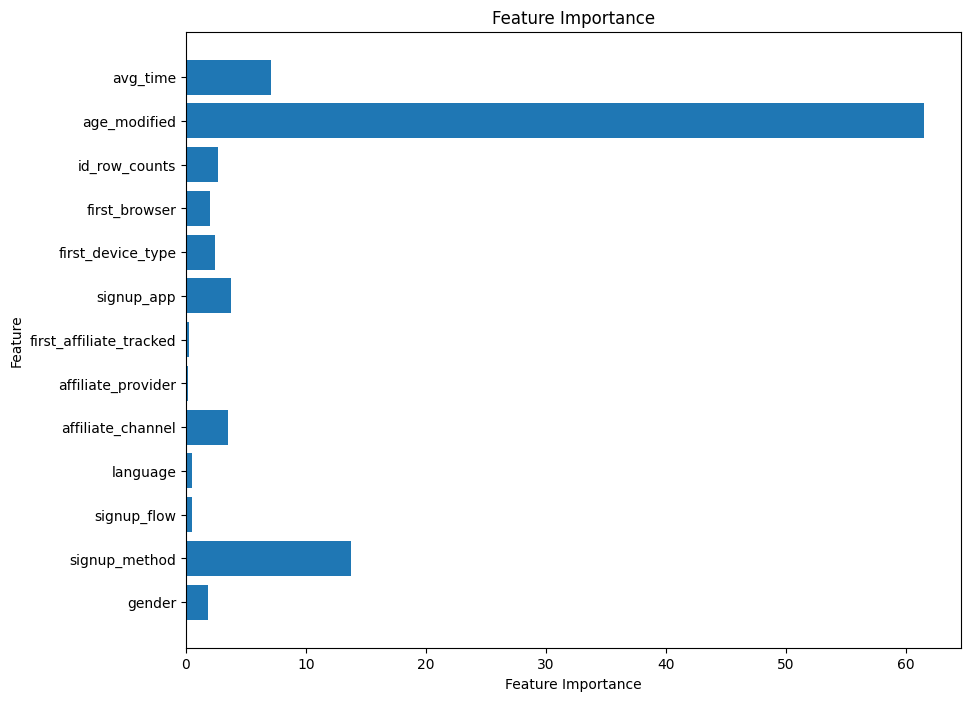

In [101]:
# 피처 중요도 확인
feature_importances = model.get_feature_importance()

# 피처 중요도 시각화
plt.figure(figsize=(10, 8))
plt.barh(range(len(feature_importances)), feature_importances, align='center')
plt.yticks(range(len(feature_importances)), X.columns)
plt.xlabel('Feature Importance')
plt.ylabel('Feature')
plt.title('Feature Importance')
plt.show()